<a href="https://colab.research.google.com/github/MagfirohIndahKarisma/PCVK_Ganjil_2023/blob/main/Week11.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# MODUL 11 – METODE MENDETEKSI OBJEK: TEMPLATE MATCHING, EDGE DETECTION, CORNER DETECTION, GRID DETECTION, CONTOUR DETECTION.

### Nama: Magfiroh Indah Karisma
### NIM: 2141720180
### Kelas: TI-3F
#### Kelompok 1

## LATIHAN PRAKTIKUM

In [1]:
from google.colab import drive
drive.mount ('/content/drive')

Mounted at /content/drive


In [34]:
import cv2 as cv
import numpy as np
from matplotlib import pyplot as plt

2. Implementasikan 6 metode template matching pada OpenCV dengan menggunakan
gambar cats_and_bunnies.jpg dan cat2_templatejpg.jpg sebagai templatenya.

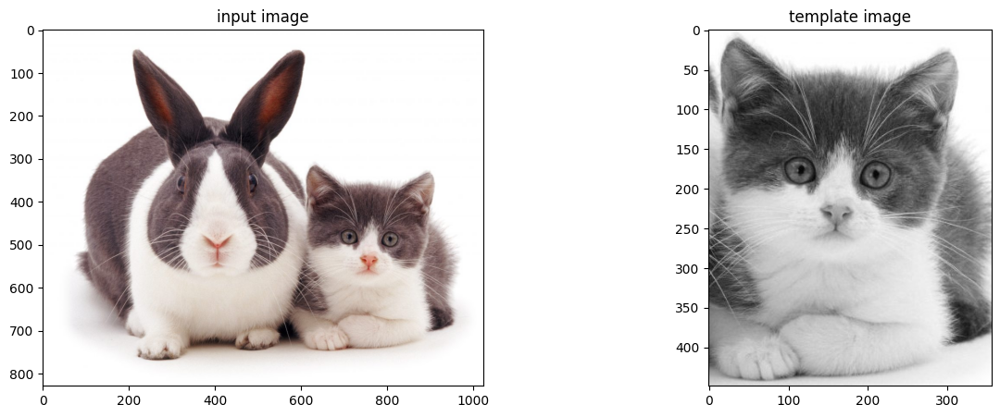

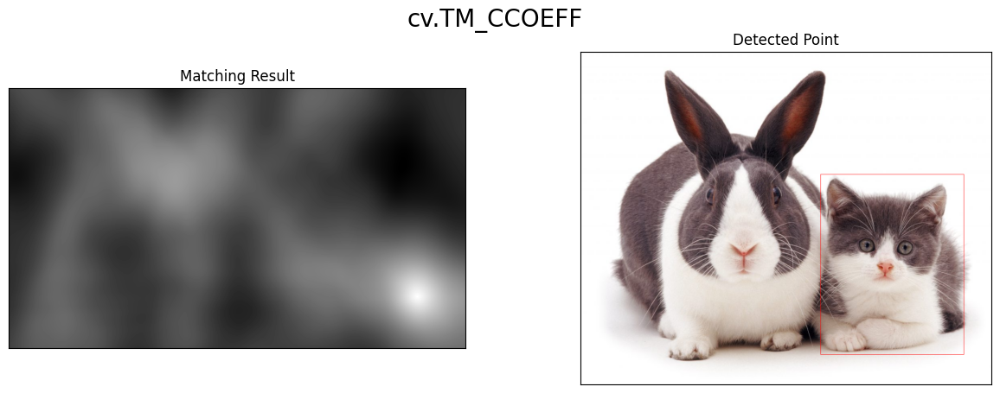

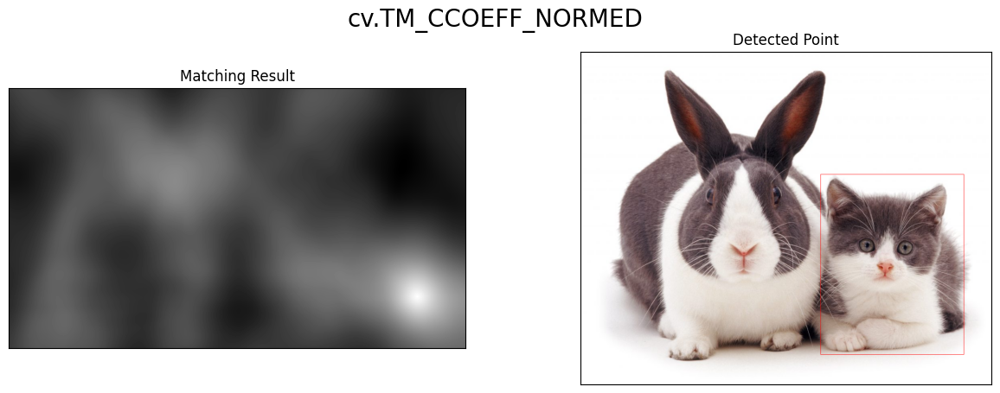

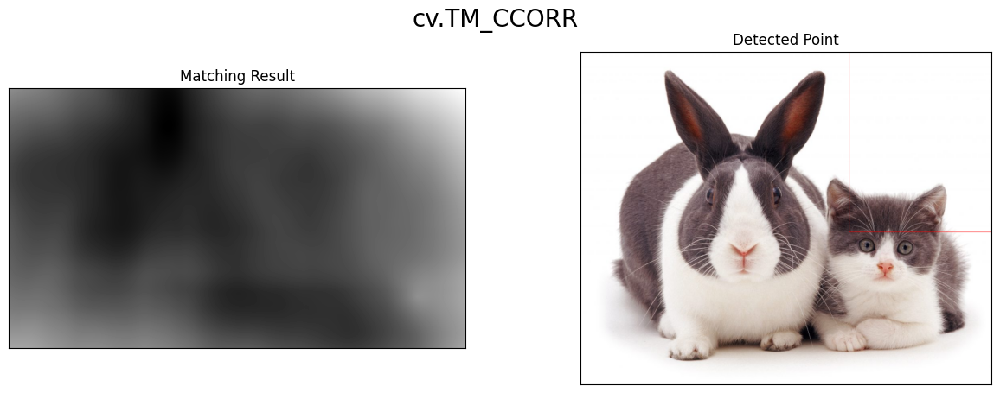

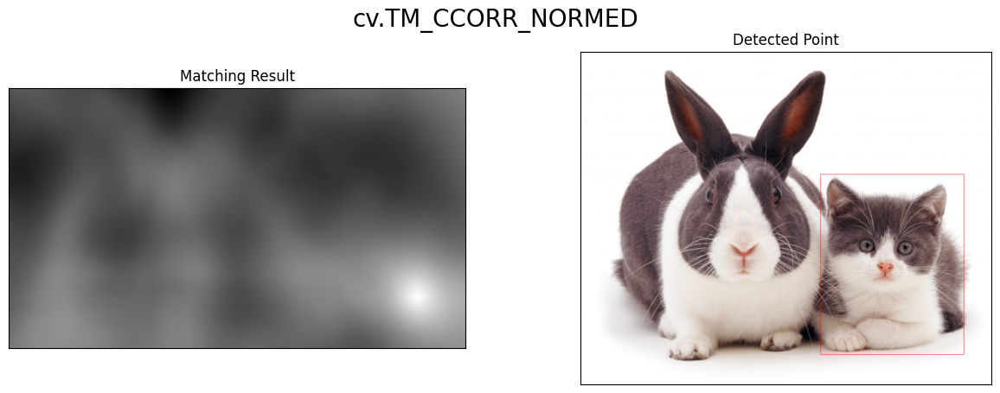

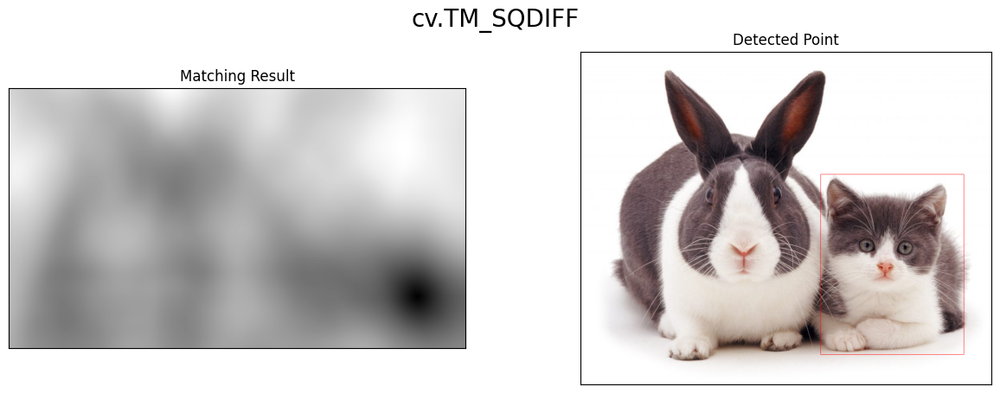

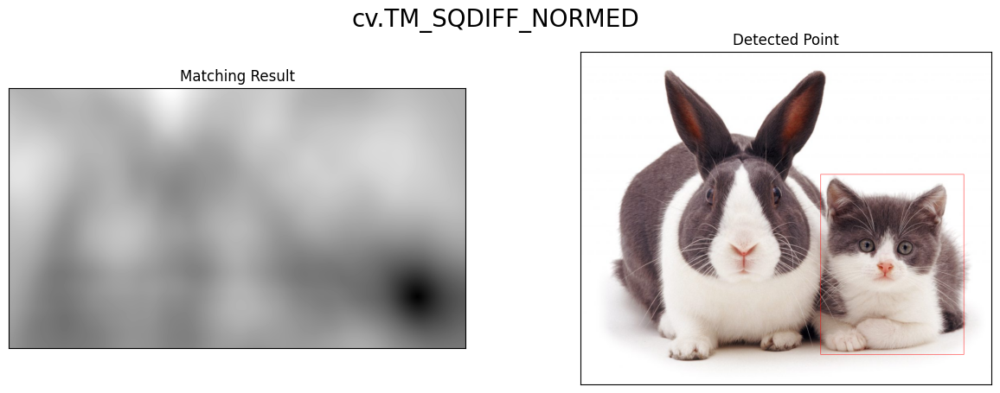

In [35]:
img = cv.imread('/content/drive/MyDrive/Study/PCVK/images/Object Detection/cats_and_bunnies.jpg')
img_gray = cv.cvtColor(img,cv.COLOR_BGR2GRAY)
img2 = img.copy()

#load citra template
template = cv.imread('/content/drive/MyDrive/Study/PCVK/images/Object Detection/cat2_templatejpg.jpg',0)
# dimensi citra
w, h = template.shape[::-1]

# print input image dan template
f, axarr = plt. subplots(1,2,figsize=(15,5)) #membuat 2 plot untuk citra input dan template
axarr[0].imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB)), axarr[0].set_title("input image")
axarr[1].imshow(cv.cvtColor(template, cv.COLOR_BGR2RGB)), axarr[1].set_title("template image")

# All the 6 methods for comparison in a list
methods = ['cv.TM_CCOEFF', 'cv.TM_CCOEFF_NORMED', 'cv.TM_CCORR',
            'cv.TM_CCORR_NORMED', 'cv.TM_SQDIFF', 'cv.TM_SQDIFF_NORMED']

for meth in methods:
    img = img2.copy()
    method = eval(meth)
    # Apply template Matching
    res = cv.matchTemplate(img_gray,template,method)
    min_val, max_val, min_loc, max_loc = cv.minMaxLoc(res)
    # If the method is TM_SQDIFF or TM_SQDIFF_NORMED, take minimum
    if method in [cv.TM_SQDIFF, cv.TM_SQDIFF_NORMED]:
        top_left = min_loc
    else:
        top_left = max_loc
    bottom_right = (top_left[0] + w, top_left[1] + h)

    cv.rectangle(img,top_left, bottom_right,(0,0,255))
    plt.figure(figsize=(15,5))
    plt.subplot(121),plt.imshow(res,cmap = 'gray')
    plt.title('Matching Result'), plt.xticks([]), plt.yticks([])
    plt.subplot(122),plt.imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB))
    plt.title('Detected Point'), plt.xticks([]), plt.yticks([])
    print("\n\n")
    plt.suptitle(meth, fontsize=20)
    plt.show()

3. Implementasikan konsep template matching tanpa menggunakan library OpenCV
untuk multiple object, menggunakan gambar bahrain.jpg untuk citra masukan dan bahrain-template.jpg sebagai citra template, sehingga menghasilkan output sebagai berikut:

In [36]:
from google.colab.patches import cv2_imshow

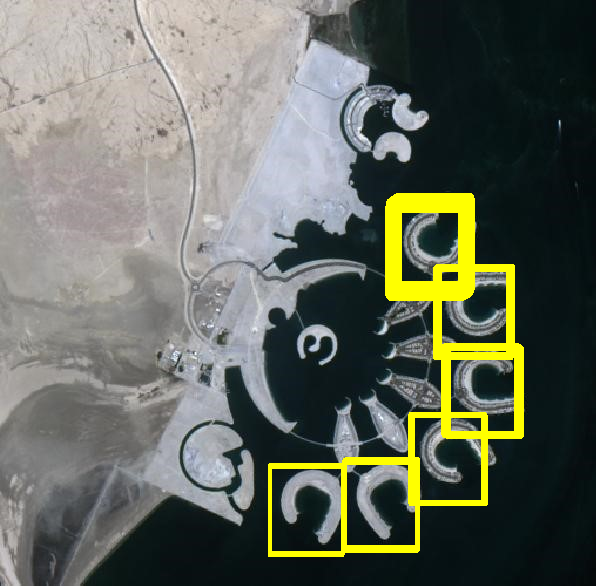

In [37]:
# Baca gambar asli dan gambar template
gambar_asli = cv2.imread('/content/drive/MyDrive/Study/PCVK/images/Object Detection/bahrain.jpg',0)
template = cv2.imread('/content/drive/MyDrive/Study/PCVK/images/Object Detection/bahrain-template.jpg', 0)
gambar_aslisli = cv2.imread('/content/drive/MyDrive/Study/PCVK/images/Object Detection/bahrain.jpg')
# Dapatkan ukuran gambar asli dan template
tinggi, lebar = template.shape[::-1]

# Lakukan template matching dengan metode CCOEFF
result = cv2.matchTemplate(gambar_asli, template, cv2.TM_CCOEFF_NORMED)

# Dapatkan lokasi dengan nilai korelasi tertinggi
min_val, max_val, min_loc, max_loc = cv2.minMaxLoc(result)

# Tentukan batasan threshold (misalnya, 0.8) untuk hasil yang dianggap cocok
threshold = 0.43

# Dapatkan lokasi hasil yang di atas threshold
lokasi_cocok = np.where(result >= threshold)

# Gambar kotak di sekitar area yang cocok
for pt in zip(*lokasi_cocok[::-1]):
    cv2.rectangle(gambar_aslisli, pt, (pt[0] + lebar, pt[1] + tinggi), (0, 255, 255), 1)

# Tampilkan gambar asli dengan kotak-kotak hasil yang cocok
cv2_imshow(gambar_aslisli)
cv2.waitKey(0)
cv2.destroyAllWindows()

4. Implementasikan metode Sobel Edge Detection, Canny Edge Detection, dan Laplacian Edge Detection pada OpenCV dengan menggunakan gambar car-park.jpg, sehingga menghasilkan luaran sebagai berikut:

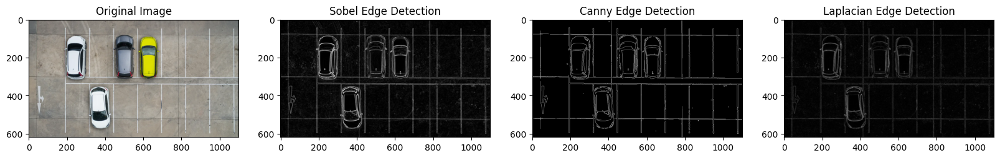

In [38]:
img0 = cv.imread('/content/drive/MyDrive/Study/PCVK/images/Object Detection/car-park.jpg')
gray = cv.cvtColor(img0, cv.COLOR_BGR2GRAY)
img = cv.GaussianBlur(gray, (3, 3), 0)

img_sobelx = cv.Sobel(img, cv.CV_64F, 1, 0, ksize=3)
img_sobely = cv.Sobel(img, cv.CV_64F, 0, 1, ksize=3)
img_sobelxy = cv.addWeighted(cv.convertScaleAbs(img_sobelx), 0.5, cv.convertScaleAbs(img_sobely), 0.5, 0)

edges_canny = cv.Canny(img, 100, 200)

img_laplacian = cv.Laplacian(img, cv.CV_64F)
img_laplacian = cv.convertScaleAbs(img_laplacian)

f, axarr = plt.subplots(1, 4, figsize=(20, 5))

axarr[0].imshow(cv.cvtColor(img0, cv.COLOR_BGR2RGB))
axarr[0].set_title('Original Image')

axarr[1].imshow(img_sobelxy, cmap='gray')
axarr[1].set_title('Sobel Edge Detection')

axarr[2].imshow(edges_canny, cmap='gray')
axarr[2].set_title('Canny Edge Detection')

axarr[3].imshow(img_laplacian, cmap='gray')
axarr[3].set_title('Laplacian Edge Detection')

plt.show()

5. Implementasikan metode Harris Corner Detection dan Shi-Tomasi Detection pada
OpenCV dengan menggunakan gambar chess-board.jpg, sehingga menghasilkan luaran sebagai berikut:

a. Harris Corner Detection

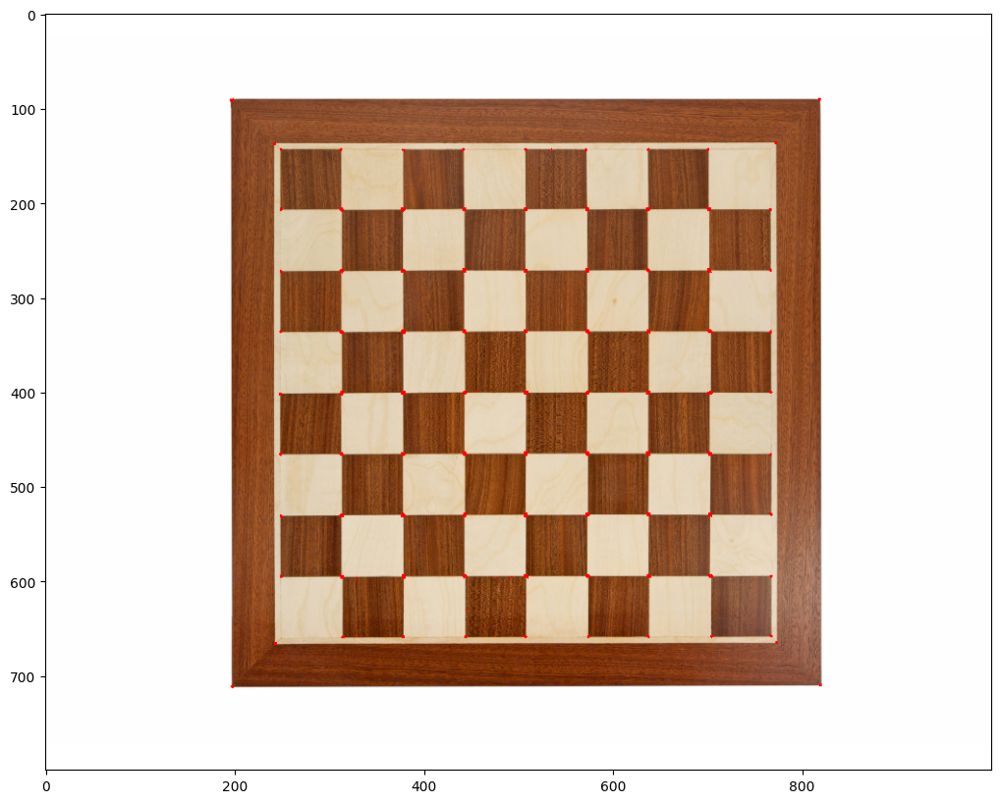

In [39]:
#load citra input
input_img = cv.imread('/content/drive/MyDrive/Study/PCVK/images/Object Detection/chess-board.jpg')
gray_img = cv.cvtColor(input_img, cv.COLOR_BGR2GRAY)
dst = cv.cornerHarris(gray_img,3,1,0.04)

gray_img = np.float32(gray_img)
harris_output = cv.cornerHarris(gray_img,2,3, 3)
#hasil harris corner dilakukan dilasi untuk menandai sudut
harris_output = cv.dilate(harris_output, None)

#Threshold untuk mengoptimalkan nilai
input_img[dst>0.01*dst.max()]=[0,0,255]

plt.figure(figsize=(20,10))
plt.imshow(cv.cvtColor(input_img, cv.COLOR_BGR2RGB))

b. Shi-Tomasi Detection

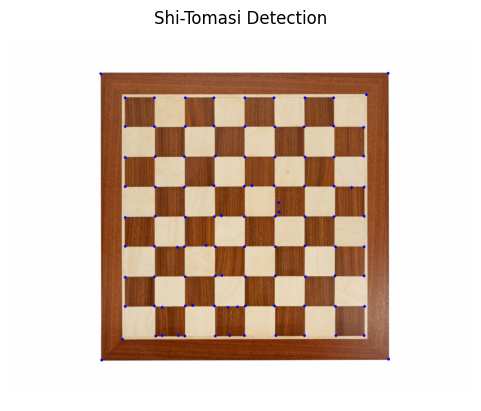

In [40]:
# Baca gambar chess-board.jpg
img = cv.imread('/content/drive/MyDrive/Study/PCVK/images/Object Detection/chess-board.jpg')
gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)

# Metode Shi-Tomasi Detection
corners = cv.goodFeaturesToTrack(gray, 100, 0.01, 10)

# Konversi koordinat titik sudut ke bilangan bulat
corners = np.int0(corners)

# Gambar lingkaran pada setiap sudut yang ditemukan
for corner in corners:
    x, y = corner.ravel()
    cv.circle(img, (x, y), 3, 255, -1)

# Tampilkan hasil Shi-Tomasi Detection
plt.imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB))
plt.title('Shi-Tomasi Detection')
plt.axis('off')
plt.show()

6. Implementasikan metode Hough Transform pada OpenCV dengan menggunakan
gambar sudoku.jpg. Tahapan proses grid detection sesuai yang terdapat pada ulasan teori, sehingga menghasilkan luaran sebagai berikut:

number of Hough lines: 33
Number of filtered lines: 1
Number of filtered lines: 2
Number of filtered lines: 3
Number of filtered lines: 4
Number of filtered lines: 5
Number of filtered lines: 6
Number of filtered lines: 7
Number of filtered lines: 8
Number of filtered lines: 9
Number of filtered lines: 10
Number of filtered lines: 11
Number of filtered lines: 12
Number of filtered lines: 13
Number of filtered lines: 14
Number of filtered lines: 14
Number of filtered lines: 15
Number of filtered lines: 15
Number of filtered lines: 15
Number of filtered lines: 16
Number of filtered lines: 16
Number of filtered lines: 17
Number of filtered lines: 17
Number of filtered lines: 18
Number of filtered lines: 18
Number of filtered lines: 19
Number of filtered lines: 19
Number of filtered lines: 19
Number of filtered lines: 20
Number of filtered lines: 20
Number of filtered lines: 20
Number of filtered lines: 20
Number of filtered lines: 20
Number of filtered lines: 20


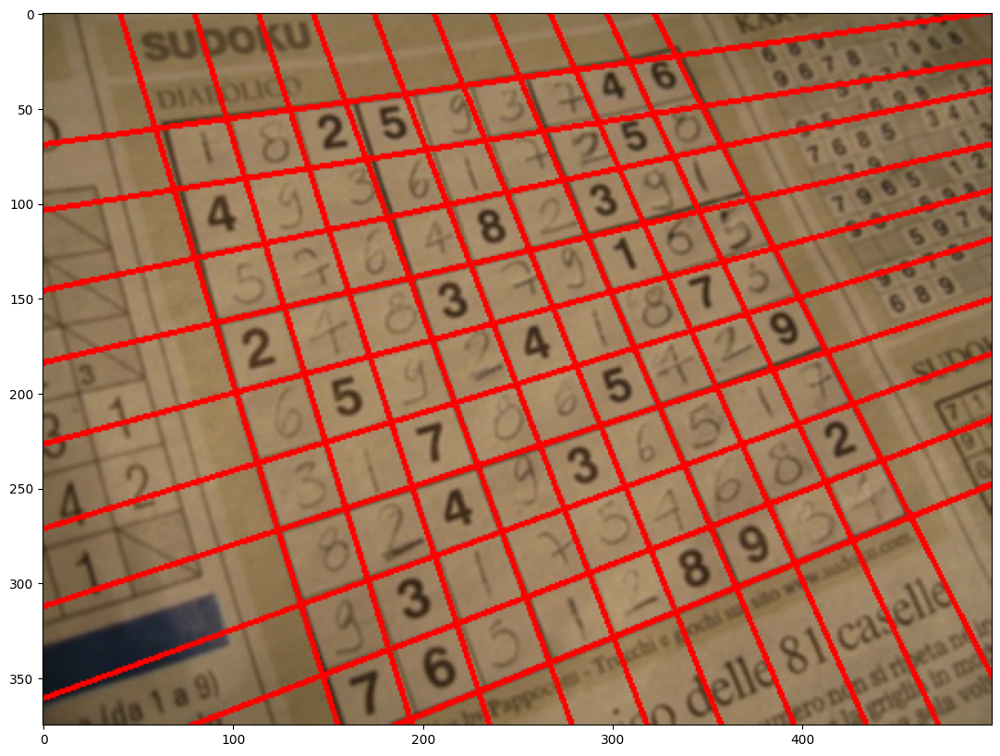

In [41]:
input_img = cv.imread('/content/drive/MyDrive/Study/PCVK/images/Object Detection/sudoku.jpg')
img_gray = cv.cvtColor(input_img, cv.COLOR_BGR2GRAY)

edges = cv.Canny (img_gray, 90, 150, apertureSize = 3)

kernel = np.ones((3,3), np.uint8)
edges = cv.dilate(edges,kernel,iterations = 1)

kernel = np.ones((5,5), np.uint8)
edges = cv.erode (edges, kernel, iterations = 1)

lines = cv.HoughLines(edges,1,np.pi/180,150)


if not lines.any():
    print('No lines found')
    exit()

if filter:
    rho_threshold = 15
    theta_threshold = 0.1


    similar_lines = {i : [] for i in range(len(lines))}
    for i in range(len(lines)):
      for j in range (len (lines)):
        if i == j:
            continue

        rho_i, theta_i = lines[i][0]
        rho_j, theta_j = lines[j][0]
        if abs(rho_i - rho_j) < rho_threshold and abs (theta_i - theta_j) < theta_threshold:
            similar_lines[i].append(j)

    indices = [i for i in range(len(lines))]
    indices.sort(key=lambda x: len(similar_lines[x]))

    line_flags = len(lines) *[True]
    for i in range(len(lines) - 1):
        if not line_flags [indices[i]]:
            continue

        for j in range(i + 1, len(lines)):
            if not line_flags[indices[j]]:
                continue
            rho_i, theta_i = lines[indices[i]][0]
            rho_j, theta_j = lines[indices[j]][0]
            if abs(rho_i - rho_j) < rho_threshold and abs(theta_i - theta_j) < theta_threshold:
                line_flags [indices[j]] = False
    print('number of Hough lines:', len(lines))

    filtered_lines = []

    if filter:
        for i in range(len(lines)):
            if line_flags[i]:
                filtered_lines.append(lines[i])

            print('Number of filtered lines:', len(filtered_lines ))
    else:
        filtered_lines = lines

    for line in filtered_lines:
        rho, theta = line [0]
        a = np.cos(theta)
        b = np.sin(theta)
        x0 = a*rho
        y0 = b*rho
        x1 = int(x0 + 1000*(-b))
        y1 = int(y0 + 1000*(a))
        x2 = int(x0 - 1000*(-b))
        y2 = int(y0 - 1000*(a))

        cv.line(input_img, (x1, y1), (x2,y2),(0,0,255),2)

    plt.figure(figsize=(20,10))
    plt.imshow(cv.cvtColor(input_img, cv.COLOR_BGR2RGB))

7. Implementasikan fungsi findContours() pada OpenCV untuk contour detection dengan menggunakan gambar laptop.jpg, sehingga menghasilkan luaran sebagai berikut:

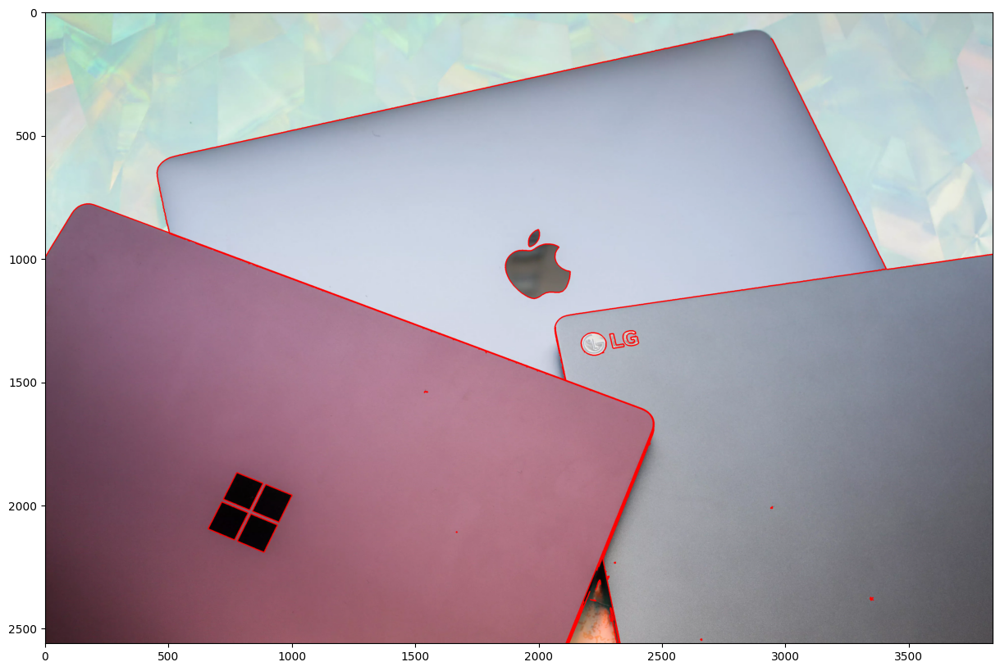

In [42]:
img = cv.imread('/content/drive/MyDrive/Study/PCVK/images/Object Detection/laptop.jpg')
img_gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)

edged = cv.Canny(img_gray, 30, 200)

contours, hierarchy = cv.findContours(edged, cv.RETR_EXTERNAL, cv.CHAIN_APPROX_NONE)

cv.drawContours(img, contours, -1, (0,0,255), 3)

plt.figure(figsize=(20,10))
plt.imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB))

## PENGAYAAN MATERI KTP

In [33]:
import cv2
import os

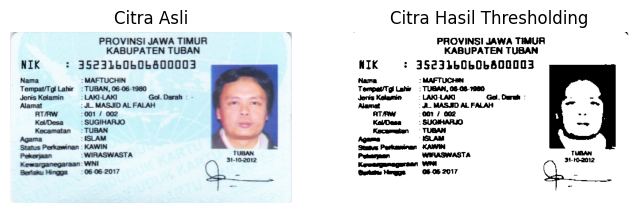

In [15]:
# Lokasi hasil pelat
path_plate = "/content/drive/MyDrive/Study/PCVK/images/KTP"

name_file = "ktp3.png"

# Inisialisasi list untuk menyimpan citra asli dan hasil thresholding
original_images = []
thresholded_images = []

# Looping file di direktori
for name in sorted(os.listdir(path_plate)):
    if name == name_file:
        src = cv2.imread(os.path.join(path_plate, name))
        blurred = src.copy()

        # Filtering
        for i in range(10):
            blurred = cv2.GaussianBlur(src, (5, 5), 0.5)

        # Ubah ke grayscale
        gray = cv2.cvtColor(blurred, cv2.COLOR_BGR2GRAY)
        ret, bw = cv2.threshold(gray.copy(), 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

        # Simpan citra asli dan hasil thresholding ke dalam list
        original_images.append(src)
        thresholded_images.append(bw)

# Tampilkan citra asli
plt.figure(figsize=(8, 8))
plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(original_images[0], cv2.COLOR_BGR2RGB))
plt.title("Citra Asli")
plt.axis('off')

# Tampilkan citra hasil thresholding
plt.subplot(1, 2, 2)
plt.imshow(thresholded_images[0], cmap='gray')
plt.title("Citra Hasil Thresholding")
plt.axis('off')

plt.show()

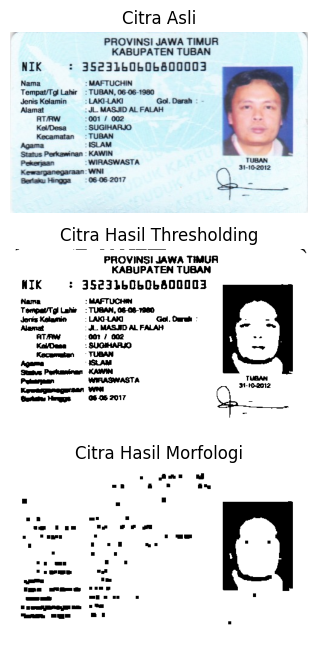

In [22]:
import numpy as np

# Lokasi hasil pelat
path_plate = "/content/drive/MyDrive/Study/PCVK/images/KTP"

name_file = "ktp3.png"

# Inisialisasi list untuk menyimpan citra asli, hasil thresholding, dan hasil morfologi
original_images = []
thresholded_images = []
morphology_images = []

# Fungsi untuk mengaplikasikan operasi penutupan
def apply_closing(image):
    kernel = np.ones((5, 5), np.uint8)
    closing_result = cv2.morphologyEx(image, cv2.MORPH_CLOSE, kernel)
    return closing_result

# Looping file di direktori
for name in sorted(os.listdir(path_plate)):
    if name == name_file:
        src = cv2.imread(os.path.join(path_plate, name))
        blurred = src.copy()

        # Filtering
        for i in range(10):
            blurred = cv2.GaussianBlur(src, (5, 5), 0.5)

        # Ubah ke grayscale
        gray = cv2.cvtColor(blurred, cv2.COLOR_BGR2GRAY)
        ret, bw = cv2.threshold(gray.copy(), 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

        # Simpan citra asli dan hasil thresholding ke dalam list
        original_images.append(src)
        thresholded_images.append(bw)

# Aplikasikan operasi penutupan pada citra thresholded
for thresholded_image in thresholded_images:
    closing_result = apply_closing(thresholded_image)
    morphology_images.append(closing_result)

# Tampilkan citra asli, citra hasil thresholding, dan citra hasil morfologi
plt.figure(figsize=(12, 8))
for i in range(len(original_images)):
    plt.subplot(3, len(original_images), i + 1)
    plt.imshow(cv2.cvtColor(original_images[i], cv2.COLOR_BGR2RGB))
    plt.title("Citra Asli")
    plt.axis('off')

    plt.subplot(3, len(thresholded_images), i + 1 + len(original_images))
    plt.imshow(thresholded_images[i], cmap='gray')
    plt.title("Citra Hasil Thresholding")
    plt.axis('off')

    plt.subplot(3, len(morphology_images), i + 1 + 2 * len(original_images))
    plt.imshow(morphology_images[i], cmap='gray')
    plt.title("Citra Hasil Morfologi")
    plt.axis('off')

plt.show()

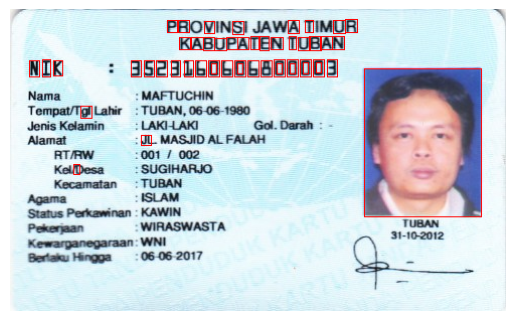

In [32]:
# Baca gambar KTP
ktp = cv2.imread('/content/drive/MyDrive/Study/PCVK/images/KTP/ktp3.png')

# Ubah gambar menjadi skala abu-abu untuk deteksi tepi
gray = cv2.cvtColor(ktp, cv2.COLOR_BGR2GRAY)

blurred = cv2.GaussianBlur(gray, (5, 5), 0)  # (5, 5) adalah ukuran kernel Gaussian, dan 0 adalah deviation

# Thresholding untuk membuat gambar biner
ret, thresholded = cv2.threshold(blurred, 127, 255, cv2.THRESH_BINARY)

# Temukan kontur pada gambar tepi
contours,  hierarchy= cv2.findContours(thresholded, cv2.RETR_CCOMP, cv2.CHAIN_APPROX_SIMPLE)

# Gambar kontur pada gambar asli
for cnt in contours:
    x, y, w, h = cv2.boundingRect(cnt)
    ras = format(w / h, '.2f')
    if h >= 40 and w >= 10 and float(ras) <= 1:
      cv2.rectangle(ktp, (x, y), (x + w, y + h), (0, 0, 255), thickness=1)
    elif h >= 10 and w >= 5 and float(ras) <= 1:
      cv2.rectangle(ktp, (x, y), (x + w, y + h), (0, 0, 255), thickness=1)

# Tampilkan gambar dengan kontur
plt.imshow(cv2.cvtColor(ktp, cv2.COLOR_BGR2RGB))
plt.axis('off')
plt.show()

## TUGAS PRAKTIKUM

Setiap citra memiliki karakteristik yang berbeda. Terapkan praktik pada materi pengayaan KTP untuk setiap dataset KTP yang tersedia. Perhatikan kondisi awal dataset, terapkan preprocessing yang sesuai jika kualitas visual citra kurang memadai untuk segera diolah. Pengerjaan dilakukan secara berkelompok dengan aturan sebagai berikut:

- Kelompok 1 – KTP Riyanto Sleman
- Kelompok 2 – KTP Galang Raka Bengkulu
- Kelompok 3 – KTP Arief Wijaya Cimahi
- Kelompok 4 – KTP Edo Nias
- Kelompok 5 – KTP Widiarso Bekasi
- Kelompok 6 – KTP Abdurrauf Soppeng

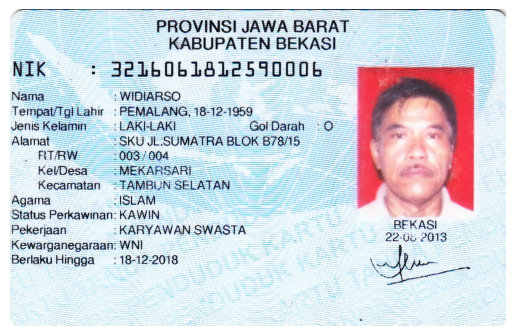

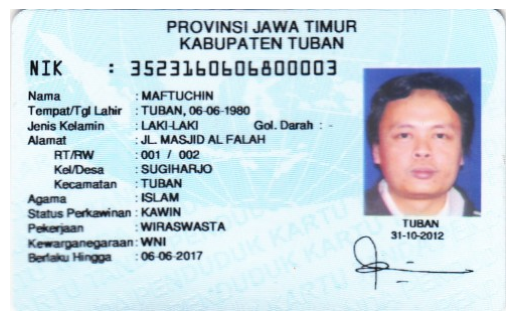

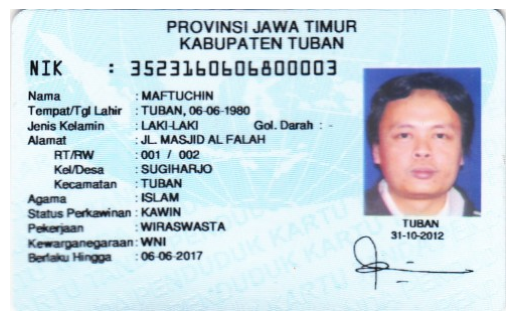

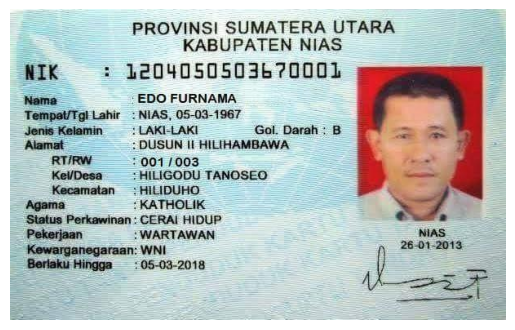

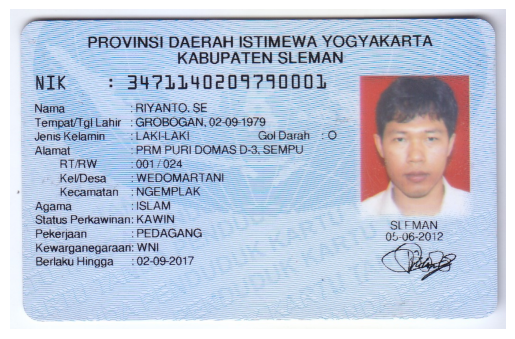

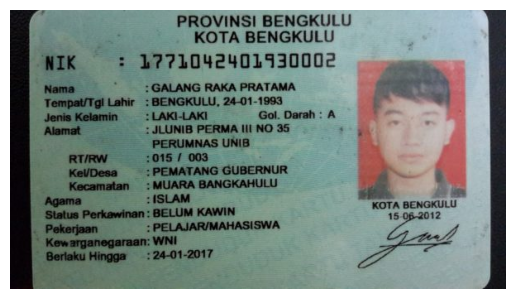

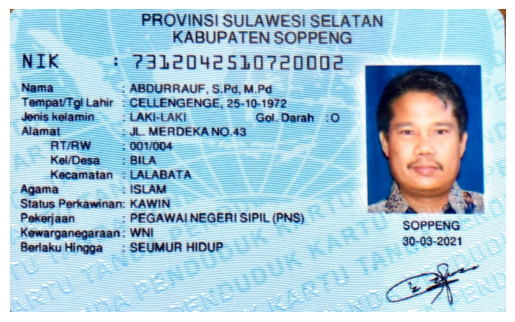

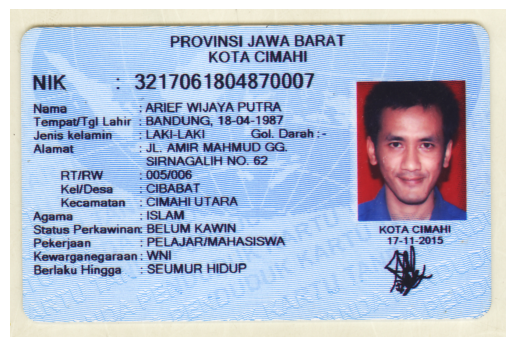

In [43]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
from google.colab.patches import cv2_imshow # path cv2.imshow di google colab
import os
import random
from sklearn.cluster import KMeans
import math

directory = "/content/drive/MyDrive/Study/PCVK/images/KTP"

# Mengambil File dari variabel directory
image_files = [file for file in os.listdir(directory) if file.endswith((".jpg", ".jpeg", ".png"))]

# Loop melalui semua gambar dalam direktori
for img_file in image_files:
    img_path = os.path.join(directory, img_file)

    img = cv2.imread(img_path)

    # Tampilkan gambar
    plt.figure()
    plt.axis('off')
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.show()

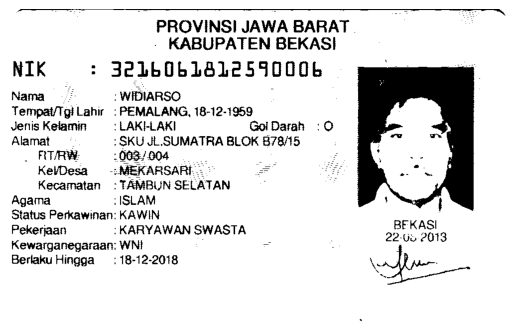

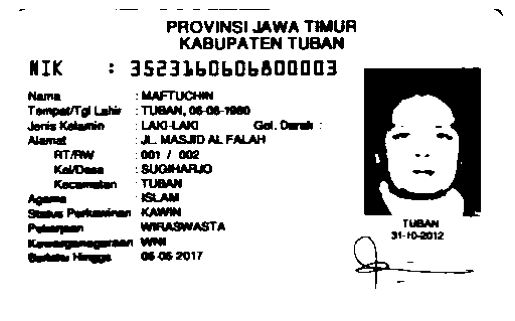

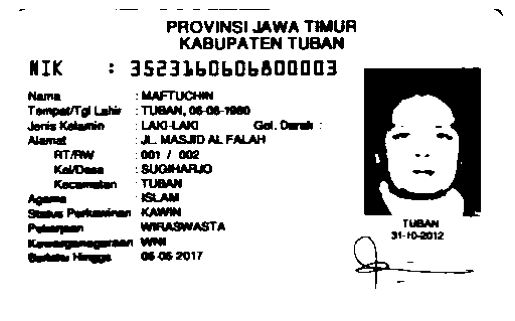

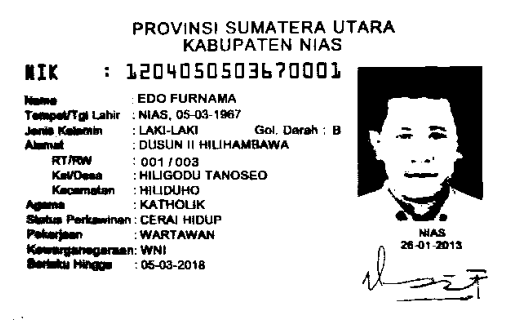

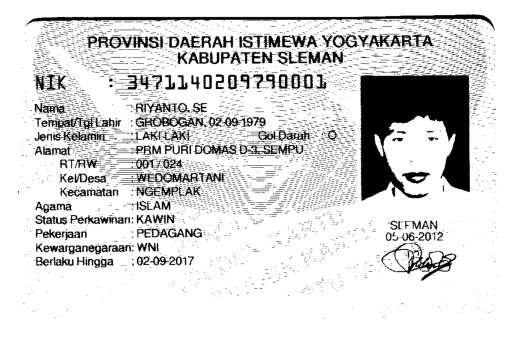

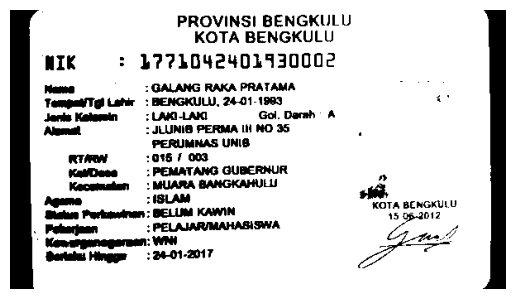

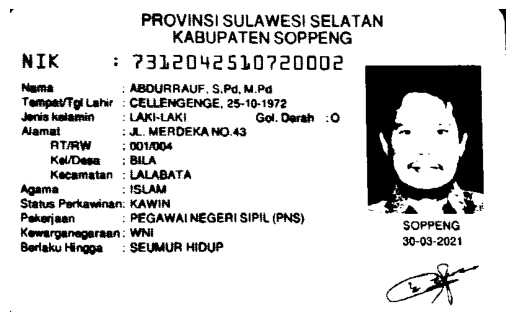

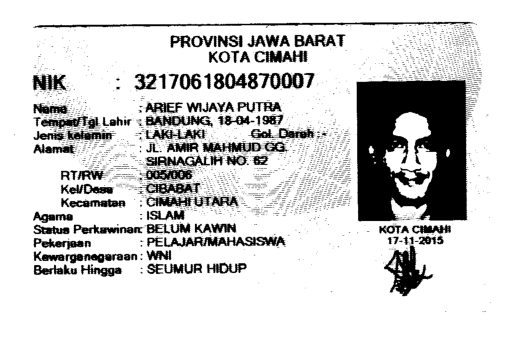

In [44]:
# Mengambil File dari variabel directory
image_files = [file for file in os.listdir(directory) if file.endswith((".jpg", ".jpeg", ".png"))]

# Loop melalui semua gambar dalam direktori
for img_file in image_files:
    img_path = os.path.join(directory, img_file)

    ktp_img = cv2.imread(img_path)
    blurred = ktp_img.copy()
    gray = blurred.copy()

    blurred = cv2.GaussianBlur(ktp_img, (5, 5), 0.5)

    gray = cv2.cvtColor(blurred, cv2.COLOR_BGR2GRAY)
    ret, bw = cv2.threshold(gray.copy(), 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

    # Tampilkan citra hasil thresholding
    plt.imshow(bw, cmap='gray')
    plt.axis('off')
    plt.show()

+ x=696, y=114, w=237, h=292, rasio=0.81
+ x=724, y=177, w=164, h=214, rasio=0.77


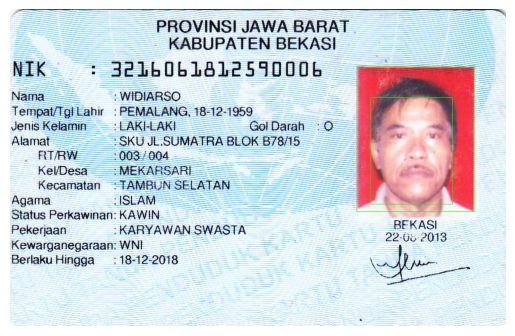

+ x=351, y=57, w=118, h=151, rasio=0.78
+ x=373, y=85, w=73, h=98, rasio=0.74


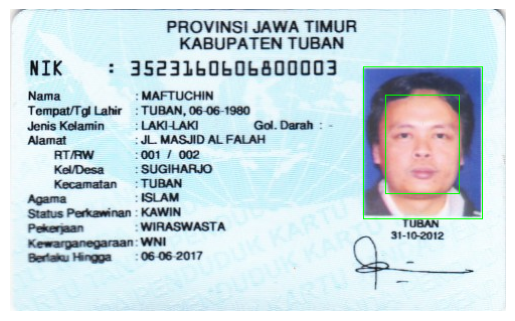

+ x=351, y=57, w=118, h=151, rasio=0.78
+ x=373, y=85, w=73, h=98, rasio=0.74


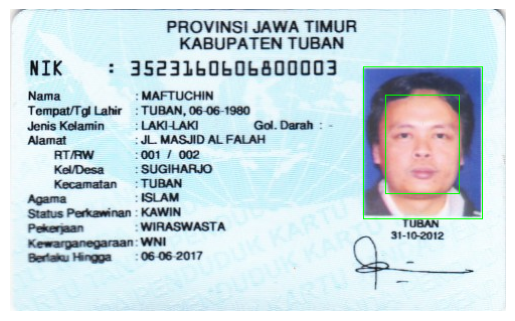

+ x=431, y=289, w=30, h=57, rasio=0.53
+ x=425, y=69, w=156, h=192, rasio=0.81


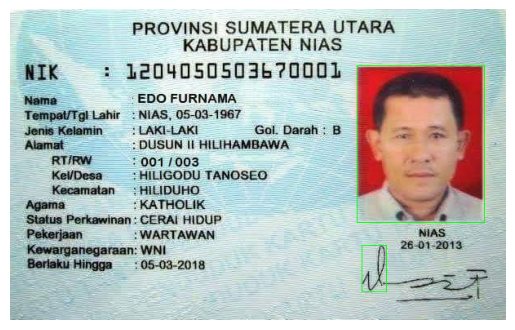

+ x=743, y=138, w=238, h=271, rasio=0.88
+ x=775, y=266, w=19, h=48, rasio=0.40


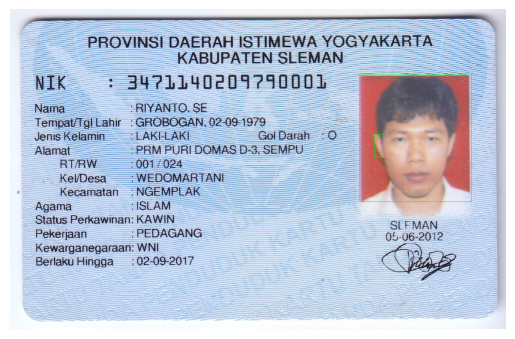

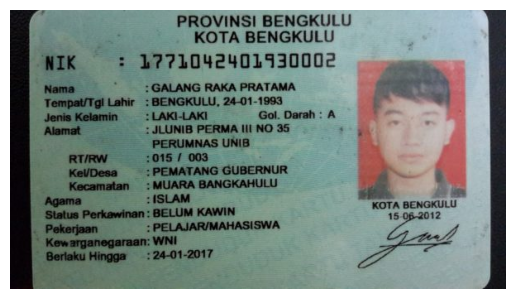

+ x=572, y=89, w=193, h=242, rasio=0.80
+ x=615, y=134, w=123, h=156, rasio=0.79


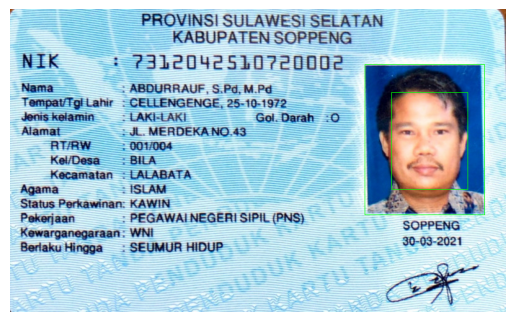

+ x=806, y=509, w=108, h=111, rasio=0.97
+ x=746, y=152, w=253, h=307, rasio=0.82
+ x=805, y=222, w=116, h=187, rasio=0.62


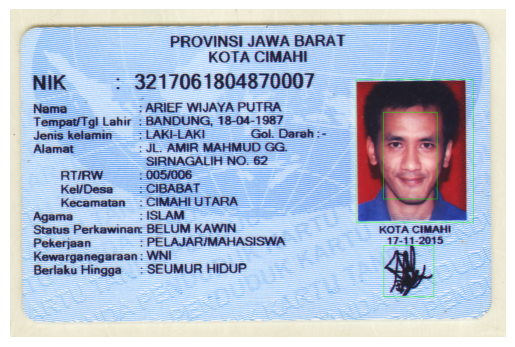

In [45]:
# Mengambil File dari variabel directory
image_files = [file for file in os.listdir(directory) if file.endswith((".jpg", ".jpeg", ".png"))]

# Loop melalui semua gambar dalam direktori
for img_file in image_files:
    img_path = os.path.join(directory, img_file)

    ktp_img = cv2.imread(img_path)
    blurred = ktp_img.copy()
    gray = blurred.copy()

    blurred = cv2.GaussianBlur(ktp_img, (5, 5), 0.5)

    gray = cv2.cvtColor(blurred, cv2.COLOR_BGR2GRAY)
    ret, bw = cv2.threshold(gray.copy(), 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

    erode = cv2.erode(bw.copy(), cv2.getStructuringElement(cv2.MORPH_OPEN, (1, 1)))

    contours, hierarchy = cv2.findContours(erode.copy(), cv2.RETR_TREE, cv2.CHAIN_APPROX_NONE)
    # Looping contours untuk mendapatkan kontur yang sesuai
    for cnt in contours:
        x, y, w, h = cv2.boundingRect(cnt)
        ras = format(w / h, '.2f')
        if h >= 40 and w >= 10 and float(ras) <= 1:
            cv2.rectangle(ktp_img, (x, y), (x + w, y + h), (0, 255, 0), thickness=1)
            print("+ x={}, y={}, w={}, h={}, rasio={}".format(x, y, w, h, ras))

    # Tampilkan citra hasil proses
    plt.imshow(cv2.cvtColor(ktp_img, cv2.COLOR_BGR2RGB))
    plt.axis('off')
    plt.show()

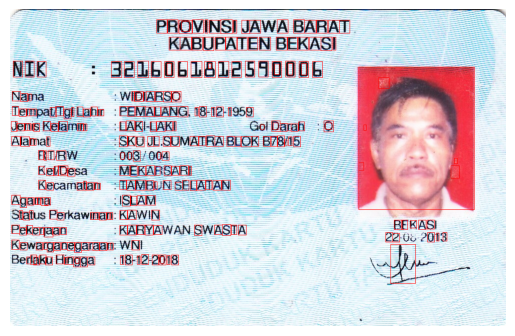

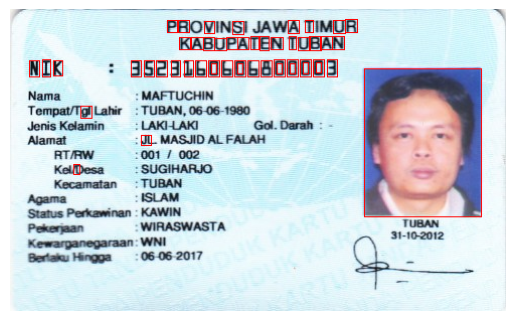

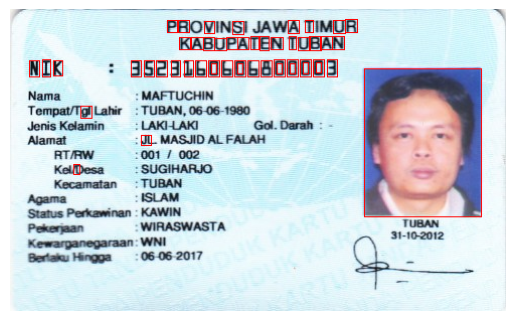

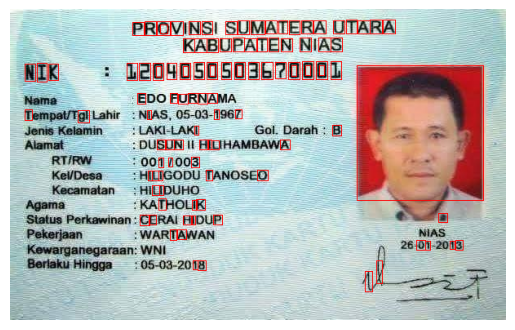

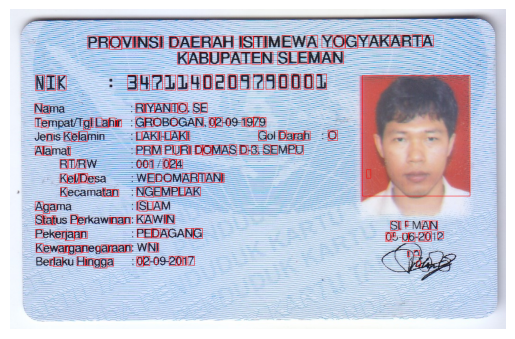

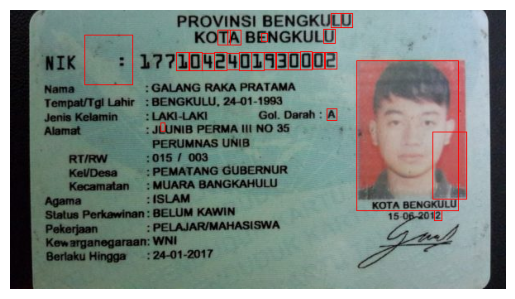

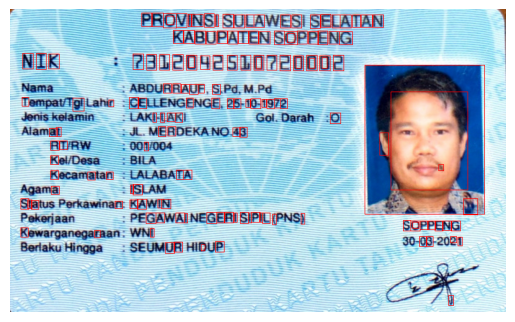

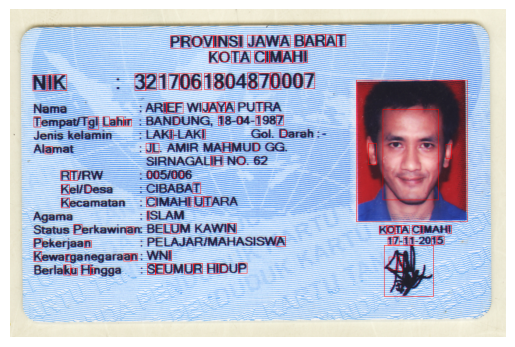

In [46]:
# Mengambil File dari variabel directory
image_files = [file for file in os.listdir(directory) if file.endswith((".jpg", ".jpeg", ".png"))]

# Loop melalui semua gambar dalam direktori
for img_file in image_files:
    img_path = os.path.join(directory, img_file)

    # Baca gambar KTP
    ktpImage = cv2.imread(img_path)

    # Ubah gambar menjadi skala abu-abu untuk deteksi tepi
    gray = cv2.cvtColor(ktpImage, cv2.COLOR_BGR2GRAY)

    blurred = cv2.GaussianBlur(gray, (5, 5), 0)  # (5, 5) adalah ukuran kernel Gaussian, dan 0 adalah deviation

    # Thresholding untuk membuat gambar biner
    ret, thresholded = cv2.threshold(blurred, 127, 255, cv2.THRESH_BINARY)

    # Temukan kontur pada gambar tepi
    contours, hierarchy= cv2.findContours(thresholded, cv2.RETR_CCOMP, cv2.CHAIN_APPROX_SIMPLE)

    # Gambar kontur pada gambar asli
    for cnt in contours:
        x, y, w, h = cv2.boundingRect(cnt)
        ras = format(w / h, '.2f')
        if h >= 40 and w >= 10 and float(ras) <= 1:
            cv2.rectangle(ktpImage, (x, y), (x + w, y + h), (0, 0, 255), thickness=1)
        elif h >= 10 and w >= 5 and float(ras) <= 1:
            cv2.rectangle(ktpImage, (x, y), (x + w, y + h), (0, 0, 255), thickness=1)

    # Tampilkan gambar dengan kontur
    plt.imshow(cv2.cvtColor(ktpImage, cv2.COLOR_BGR2RGB))
    plt.axis('off')
    plt.show()